$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 3: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

We'll use the same data as in Part 2.

But again, you can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`.

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File C:\Users\Nataniel\.pytorch-datasets\lfw-bush.zip exists, skipping download.
Extracting C:\Users\Nataniel\.pytorch-datasets\lfw-bush.zip...
Extracted 531 to C:\Users\Nataniel\.pytorch-datasets\lfw/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


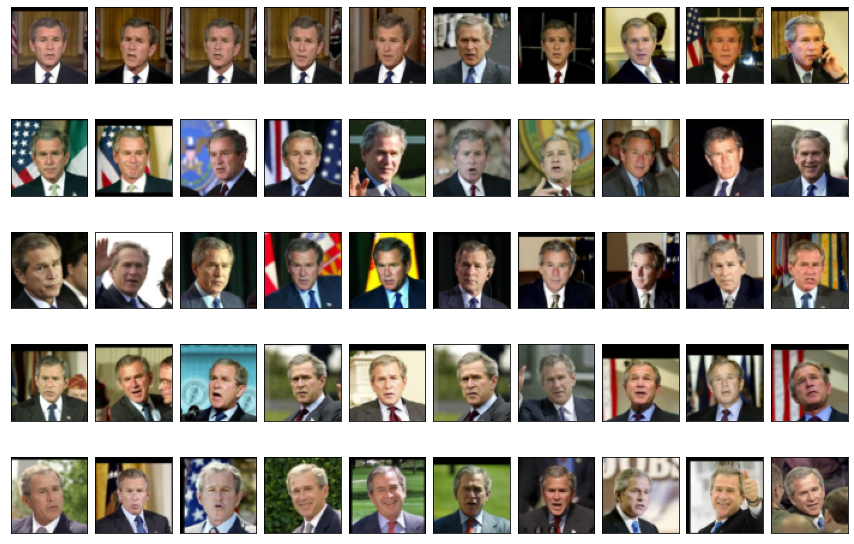

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(512, 1024, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (10): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
  )
  (fc): Sequential(
    (0): Linear(in_features=16384, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=1, bias=True)
  )
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (fc): Linear(in_features=128, out_features=16384, bias=True)
  (cnn): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 3, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (10): Tanh()
  )
)
torch.Size([1, 3, 64, 64])


### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)

tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

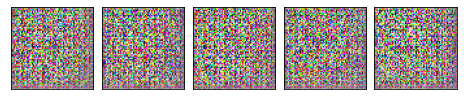

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [11]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 32, 'z_dim': 128, 'data_label': 1, 'label_noise': 0.2, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.14it/s]
Discriminator loss: 0.40303186140954494
Generator loss:     5.885708177790923


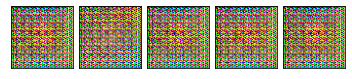

--- EPOCH 2/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.11940816614557714
Generator loss:     8.822657753439511


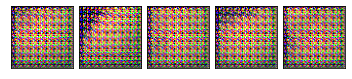

--- EPOCH 3/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.22664241711882985
Generator loss:     9.872018757988425


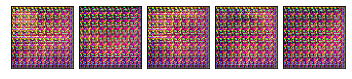

--- EPOCH 4/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.11197720062645043
Generator loss:     10.068492132074693


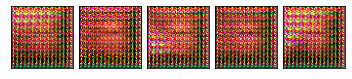

--- EPOCH 5/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 1.1322235671036385
Generator loss:     6.484690960715799


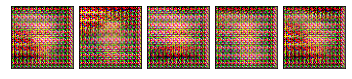

--- EPOCH 6/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.26889390673707514
Generator loss:     5.218958966872272


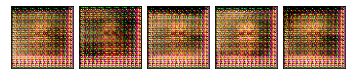

--- EPOCH 7/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.5675496027311858
Generator loss:     5.578812277875841


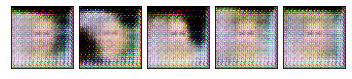

--- EPOCH 8/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.9801220420528861
Generator loss:     3.79226992410772


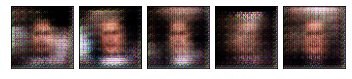

--- EPOCH 9/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.17it/s]
Discriminator loss: 0.7805842844878926
Generator loss:     2.7623133448993458


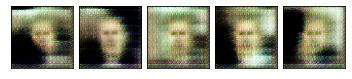

--- EPOCH 10/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.8994943333022735
Generator loss:     3.3914562884499047
best loss: 2.7623133448993458


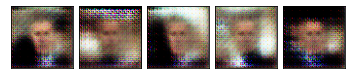

--- EPOCH 11/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.17it/s]
Discriminator loss: 0.8585163424996769
Generator loss:     2.035608428366044
best loss: 2.035608428366044
Saved checkpoint.


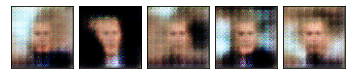

--- EPOCH 12/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.16it/s]
Discriminator loss: 0.6377017191227745
Generator loss:     2.840258282773635
best loss: 2.035608428366044


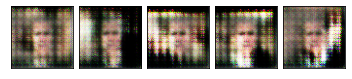

--- EPOCH 13/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 1.0265374131062452
Generator loss:     2.416100873666651
best loss: 2.035608428366044


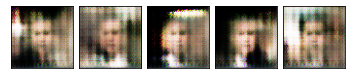

--- EPOCH 14/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.7735212673159206
Generator loss:     2.616131873691783
best loss: 2.035608428366044


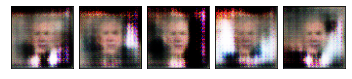

--- EPOCH 15/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.4735081533298773
Generator loss:     3.180473741363077
best loss: 2.035608428366044


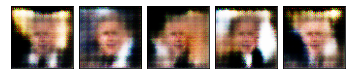

--- EPOCH 16/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.8187493611784542
Generator loss:     2.5931171354125526
best loss: 2.035608428366044


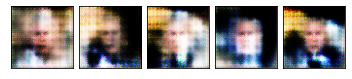

--- EPOCH 17/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.539388515493449
Generator loss:     3.1750753627103916
best loss: 2.035608428366044


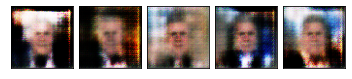

--- EPOCH 18/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.816807978293475
Generator loss:     3.0350541437373444
best loss: 2.035608428366044


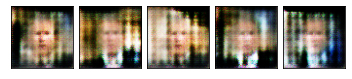

--- EPOCH 19/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.6284686265622869
Generator loss:     3.162091437508078
best loss: 2.035608428366044


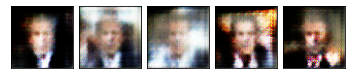

--- EPOCH 20/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.2831199929556426
Generator loss:     3.865333515055039
best loss: 2.035608428366044


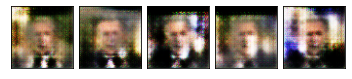

--- EPOCH 21/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.6632915568702361
Generator loss:     3.549130853484659
best loss: 2.035608428366044


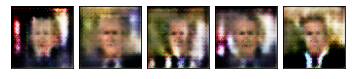

--- EPOCH 22/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.44675605700296517
Generator loss:     3.5998436773524567
best loss: 2.035608428366044


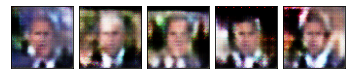

--- EPOCH 23/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.5335460650351118
Generator loss:     3.341303124147303
best loss: 2.035608428366044


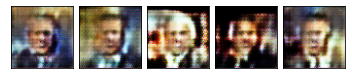

--- EPOCH 24/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.581960693878286
Generator loss:     3.458039508146398
best loss: 2.035608428366044


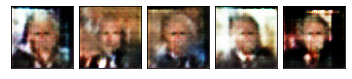

--- EPOCH 25/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.4405250549316406
Generator loss:     3.8347447759964886
best loss: 2.035608428366044


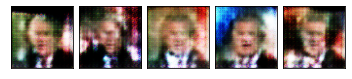

--- EPOCH 26/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.6586606572656071
Generator loss:     3.346420231987448
best loss: 2.035608428366044


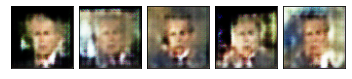

--- EPOCH 27/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.8460592820363886
Generator loss:     3.11531498151667
best loss: 2.035608428366044


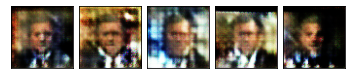

--- EPOCH 28/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.5028990454533521
Generator loss:     3.432065220440135
best loss: 2.035608428366044


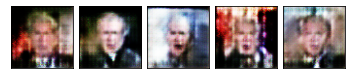

--- EPOCH 29/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.38694385263849707
Generator loss:     3.5857800175161922
best loss: 2.035608428366044


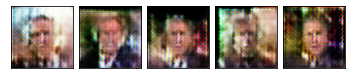

--- EPOCH 30/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.6947614110129721
Generator loss:     3.701016426086426
best loss: 2.035608428366044


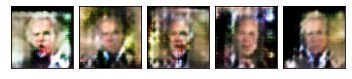

--- EPOCH 31/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.37496871632688183
Generator loss:     3.1811088463839363
best loss: 2.035608428366044


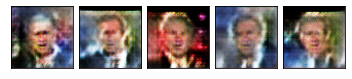

--- EPOCH 32/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.18691755962722442
Generator loss:     3.778574789271635
best loss: 2.035608428366044


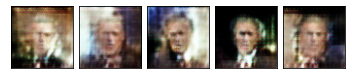

--- EPOCH 33/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.8066199632251964
Generator loss:     3.6479049675604878
best loss: 2.035608428366044


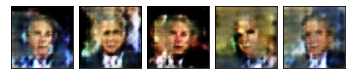

--- EPOCH 34/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.27304766217575355
Generator loss:     3.6227642508114086
best loss: 2.035608428366044


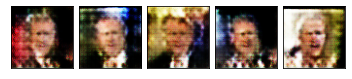

--- EPOCH 35/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.6175360241357017
Generator loss:     4.014106885475271
best loss: 2.035608428366044


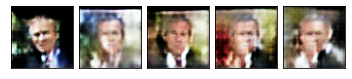

--- EPOCH 36/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.6531728155472699
Generator loss:     3.794403216418098
best loss: 2.035608428366044


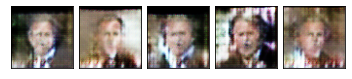

--- EPOCH 37/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.26135078861432914
Generator loss:     3.9508058744318344
best loss: 2.035608428366044


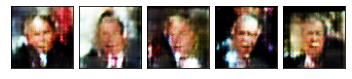

--- EPOCH 38/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.6156938302823726
Generator loss:     3.99521706384771
best loss: 2.035608428366044


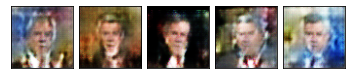

--- EPOCH 39/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.34833995471982393
Generator loss:     3.7704281666699577
best loss: 2.035608428366044


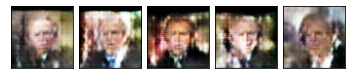

--- EPOCH 40/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.624349098871736
Generator loss:     4.0580531288595765
best loss: 2.035608428366044


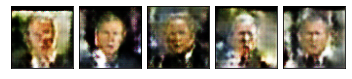

--- EPOCH 41/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.3267037590198657
Generator loss:     3.8131697177886963
best loss: 2.035608428366044


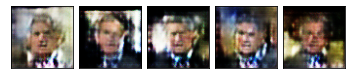

--- EPOCH 42/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.46178993933341084
Generator loss:     4.26849956372205
best loss: 2.035608428366044


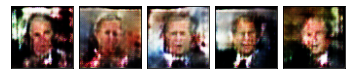

--- EPOCH 43/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.26140209550366683
Generator loss:     4.242182366988239
best loss: 2.035608428366044


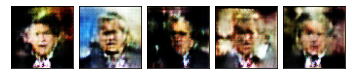

--- EPOCH 44/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.27918217024382425
Generator loss:     4.583649438970229
best loss: 2.035608428366044


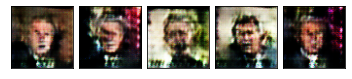

--- EPOCH 45/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.6780805841964834
Generator loss:     3.686142150093527
best loss: 2.035608428366044


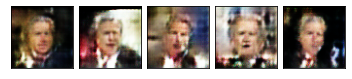

--- EPOCH 46/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.23681861118358724
Generator loss:     3.819471338215996
best loss: 2.035608428366044


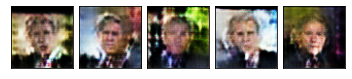

--- EPOCH 47/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.6170458171297523
Generator loss:     4.188490657245412
best loss: 2.035608428366044


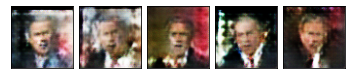

--- EPOCH 48/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.2700295670724967
Generator loss:     4.291489713332233
best loss: 2.035608428366044


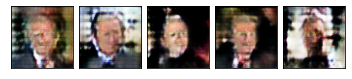

--- EPOCH 49/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.13132688030600548
Generator loss:     4.404627056682811
best loss: 2.035608428366044


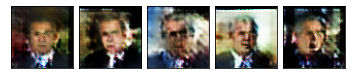

--- EPOCH 50/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.27682421455050216
Generator loss:     5.148104892057531
best loss: 2.035608428366044


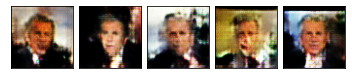

--- EPOCH 51/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.4463455120430273
Generator loss:     4.6394687540390915
best loss: 2.035608428366044


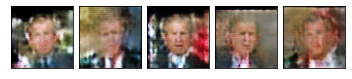

--- EPOCH 52/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.19898190239773078
Generator loss:     4.006754819084616
best loss: 2.035608428366044


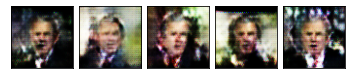

--- EPOCH 53/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 1.1396688325878452
Generator loss:     2.8276287106906666
best loss: 2.035608428366044


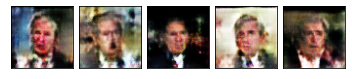

--- EPOCH 54/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.2938151824123719
Generator loss:     3.1686927010031307
best loss: 2.035608428366044


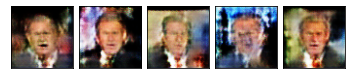

--- EPOCH 55/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.1852955656016574
Generator loss:     4.14721801701714
best loss: 2.035608428366044


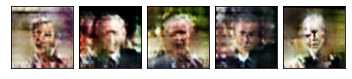

--- EPOCH 56/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.2797113747938591
Generator loss:     4.142659640158801
best loss: 2.035608428366044


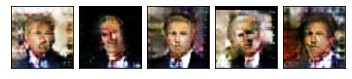

--- EPOCH 57/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.5858328473918578
Generator loss:     4.118579794378841
best loss: 2.035608428366044


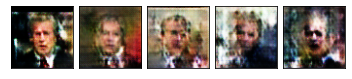

--- EPOCH 58/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.20282255091211376
Generator loss:     4.062532747493071
best loss: 2.035608428366044


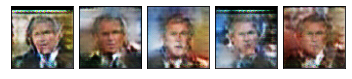

--- EPOCH 59/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.13629911127774155
Generator loss:     4.245766597635606
best loss: 2.035608428366044


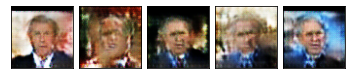

--- EPOCH 60/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.7181644820991684
Generator loss:     3.610518721973195
best loss: 2.035608428366044


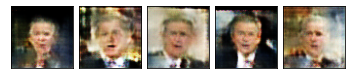

--- EPOCH 61/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.15854930192889535
Generator loss:     4.454076121835148
best loss: 2.035608428366044


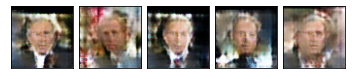

--- EPOCH 62/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.4144006029647939
Generator loss:     4.517474749509026
best loss: 2.035608428366044


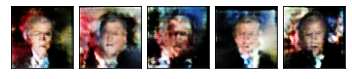

--- EPOCH 63/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.19941008846987696
Generator loss:     4.78250844338361
best loss: 2.035608428366044


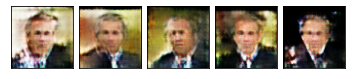

--- EPOCH 64/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.8124361590427511
Generator loss:     3.2808743645163143
best loss: 2.035608428366044


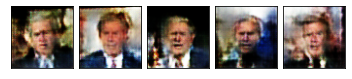

--- EPOCH 65/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.24382662992267048
Generator loss:     4.247254918603336
best loss: 2.035608428366044


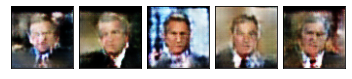

--- EPOCH 66/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.06751293743796208
Generator loss:     4.811687834122601
best loss: 2.035608428366044


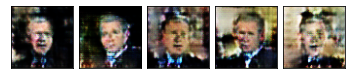

--- EPOCH 67/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.33376992800656485
Generator loss:     5.320343101725859
best loss: 2.035608428366044


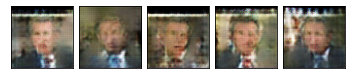

--- EPOCH 68/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.09326638401869465
Generator loss:     4.766711221021764
best loss: 2.035608428366044


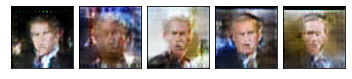

--- EPOCH 69/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.11620690309278228
Generator loss:     5.393582848941579
best loss: 2.035608428366044


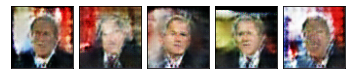

--- EPOCH 70/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.21220301683334744
Generator loss:     5.54736187878777
best loss: 2.035608428366044


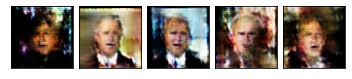

--- EPOCH 71/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.19706158997381434
Generator loss:     5.848700761795044
best loss: 2.035608428366044


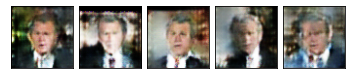

--- EPOCH 72/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.1226366539759671
Generator loss:     5.791841563056497
best loss: 2.035608428366044


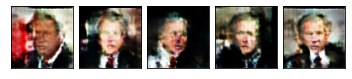

--- EPOCH 73/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.43258063451332207
Generator loss:     5.797540496377384
best loss: 2.035608428366044


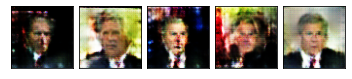

--- EPOCH 74/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.18170718092690497
Generator loss:     4.822733009562773
best loss: 2.035608428366044


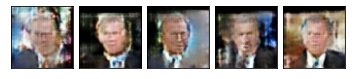

--- EPOCH 75/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.2964242449139847
Generator loss:     5.159091963487513
best loss: 2.035608428366044


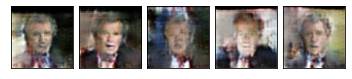

--- EPOCH 76/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.212330624461174
Generator loss:     5.161161058089313
best loss: 2.035608428366044


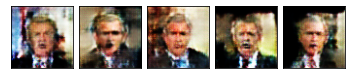

--- EPOCH 77/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.24496983912061243
Generator loss:     5.17617483700023
best loss: 2.035608428366044


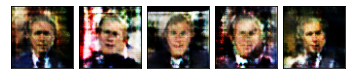

--- EPOCH 78/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.06853779076653368
Generator loss:     5.758785724639893
best loss: 2.035608428366044


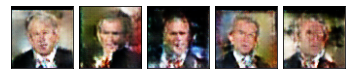

--- EPOCH 79/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.023430792505250257
Generator loss:     5.539976190118229
best loss: 2.035608428366044


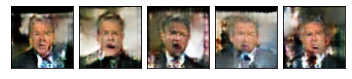

--- EPOCH 80/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.8899365161709926
Generator loss:     5.378069667255177
best loss: 2.035608428366044


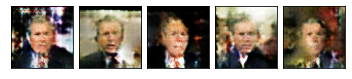

--- EPOCH 81/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.1778131230350803
Generator loss:     3.386355287888471
best loss: 2.035608428366044


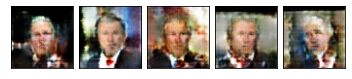

--- EPOCH 82/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.0948383786222514
Generator loss:     4.544622421264648
best loss: 2.035608428366044


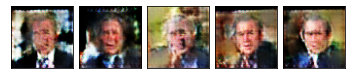

--- EPOCH 83/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.09995642939911169
Generator loss:     4.91271185874939
best loss: 2.035608428366044


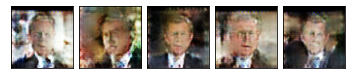

--- EPOCH 84/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.12074478211648323
Generator loss:     5.478826214285458
best loss: 2.035608428366044


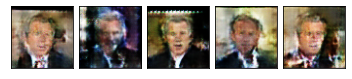

--- EPOCH 85/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.21it/s]
Discriminator loss: 0.05480305653284578
Generator loss:     5.446499824523926
best loss: 2.035608428366044


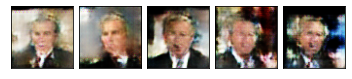

--- EPOCH 86/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.023681917611290428
Generator loss:     5.830303865320542
best loss: 2.035608428366044


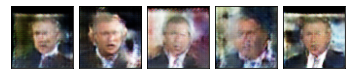

--- EPOCH 87/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.29236283481997605
Generator loss:     6.074816198909984
best loss: 2.035608428366044


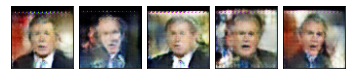

--- EPOCH 88/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.5388347054557765
Generator loss:     5.019122768850887
best loss: 2.035608428366044


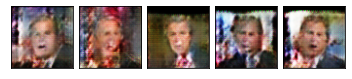

--- EPOCH 89/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.16617115455515244
Generator loss:     4.214614012662103
best loss: 2.035608428366044


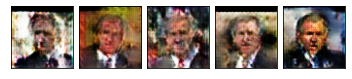

--- EPOCH 90/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.03817188213853275
Generator loss:     5.16064983255723
best loss: 2.035608428366044


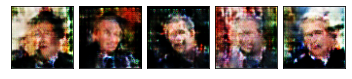

--- EPOCH 91/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.30091574371737595
Generator loss:     4.845699198105756
best loss: 2.035608428366044


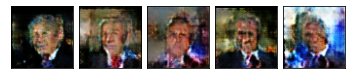

--- EPOCH 92/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.3248004344675471
Generator loss:     5.422553861842436
best loss: 2.035608428366044


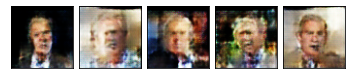

--- EPOCH 93/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.28782438059501786
Generator loss:     4.913632869720459
best loss: 2.035608428366044


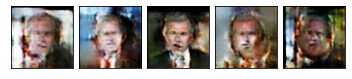

--- EPOCH 94/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.07055761051528595
Generator loss:     5.125183273764217
best loss: 2.035608428366044


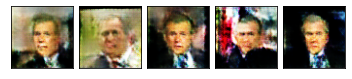

--- EPOCH 95/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.11817835764411617
Generator loss:     5.236680704004624
best loss: 2.035608428366044


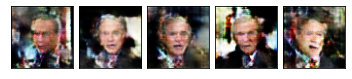

--- EPOCH 96/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.1250849830753663
Generator loss:     5.345859976375804
best loss: 2.035608428366044


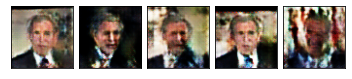

--- EPOCH 97/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.05536082255489686
Generator loss:     5.711529731750488
best loss: 2.035608428366044


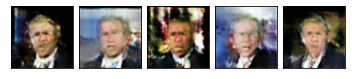

--- EPOCH 98/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.20it/s]
Discriminator loss: 0.05001397419940023
Generator loss:     5.9611733380485985
best loss: 2.035608428366044


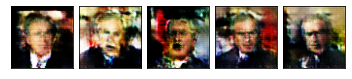

--- EPOCH 99/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.19it/s]
Discriminator loss: 0.011385919854921453
Generator loss:     5.805493214551141
best loss: 2.035608428366044


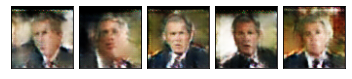

--- EPOCH 100/100 ---
100%|██████████| 17/17 [00:14<00:00,  1.18it/s]
Discriminator loss: 0.056407890118220276
Generator loss:     6.342956486870261
best loss: 2.035608428366044


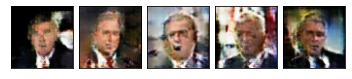

In [12]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


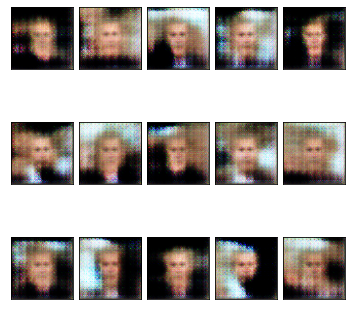

In [13]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [14]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [15]:
display_answer(hw3.answers.part3_q1)


When training we want to ensure the gradient observed with the coupled model (Generator & Discriminator) does not propagate back to the Genrator. 
So we decouple the pair and train the Dicriminator only, on the forward pass. Next we train the Generator while keeping the gradients for calculating 
the loss


### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [16]:
display_answer(hw3.answers.part3_q2)


1. As the Discriminator has itself not been trained the loss by the Generator may be low, while the images still are of poor quality. We overcame 
this by designating a minimum number of epochs before we begin to test for low loss. We tried to think of more "elegant" solutions to this but haven't 
found one.

2. If such a case happens it means that the Discriminator is getting better at identifying *real* images, while simutaneously identifying generated 
images as *real* as well



### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [17]:
display_answer(hw3.answers.part3_q3)


We can see that our GAN images are still missing sharpness, yet they are less blurry than the ones the VAE model outputed. We can explain this in part 
do to the greater variance which gives us in comparison, sharper edges.

